In [ ]:
import tensorflow as tf

devices = tf.config.list_logical_devices()
for device in devices:
    if device.device_type == 'TPU':
        print("TPU is available.")
        break

In [ ]:
pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 5.8 MB/s eta 0:00:00


Import Libraries

In [ ]:
from typing import Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sb
from PIL import Image
from matplotlib import ticker
from sklearn import metrics
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import preprocess_input, decode_predictions
SEED = 51432
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()
plt.rc("axes.spines", right=False, top=False)
plt.rc("font", family="serif", size=10.5)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.utils import load_img,img_to_array

import tensorflow_addons as tfa
from tensorflow.keras.models import Model

from keras.utils import plot_model
from imblearn.over_sampling import SMOTE
from keras.callbacks import ModelCheckpoint
from keras import backend as K
from keras.layers import BatchNormalization, Conv2D, Conv2DTranspose, Dense, Dropout, Flatten, GlobalAveragePooling2D, Input, MaxPooling2D
from keras.models import Model, Sequential,  load_model
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve, roc_auc_score
from tensorflow.keras.applications import ResNet50V2, VGG16, InceptionV3
from tensorflow.keras.metrics import Accuracy,binary_crossentropy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Mounting the google drive to retrive the data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Loading the Breakhis dataset text data

In [ ]:
#Loading the text file
fold_df = pd.read_csv("/content/drive/MyDrive/Cancerdetection/BreakHIS/Folds.csv")
fold_df = fold_df.rename(columns = {"filename":"path"})
#Defining the paths
img_path = "./BreaKHis_v1/"
classes = ["benign","malign"]
fold_df

,fold,mag,grp,path
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
...,...,...,...,...
39540,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39541,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39542,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39543,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...


Splitting the filename and label from path

In [ ]:
fold_df['filename'] = fold_df['path'].apply(lambda x:x.split("/")[-1])
fold_df["label"] = fold_df['path'].apply(lambda x: x.split("/")[3])
fold_df.head(5)

,fold,mag,grp,path,filename,label
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-001.png,benign
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-002.png,benign
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-003.png,benign
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-004.png,benign
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-005.png,benign


Loading the image data paths

In [ ]:
import pathlib
folder1 = '/content/drive/MyDrive/Cancerdetection/BreakHIS/BreaKHis_v1/BreaKHis_v1/histology_slides/breast'
folder_path = pathlib.Path(folder1)

Creating a new directory to store the images

In [ ]:
#Creating new directory
import os
import shutil
os.makedirs("../Cancer/")

Storing the images to the path

In [ ]:
for i in fold_df['path']:
    src = "/content/drive/MyDrive/Cancerdetection/BreakHIS/BreaKHis_v1/" + i
    dest = "../Cancer/"
    # saving the images with its class and patient_id
    dest = os.path.join(dest,src.split("/")[10]+ "_" + src.split("/")[-1])
    shutil.copyfile(src,dest)

In [ ]:
#length of the directory
len(os.listdir("../Cancer/"))

1951

File location and class of the image is extracted from the filename

In [ ]:
fold_df['file_loc'] = fold_df['label'] + "_" + fold_df['filename']
fold_df['class'] = fold_df['label'].apply(lambda x: 0 if x =='benign' else 1)
fold_df.head(5)

,fold,mag,grp,path,filename,label,file_loc,class
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-001.png,benign,benign_SOB_B_A-14-22549AB-100-001.png,0
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-002.png,benign,benign_SOB_B_A-14-22549AB-100-002.png,0
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-003.png,benign,benign_SOB_B_A-14-22549AB-100-003.png,0
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-004.png,benign,benign_SOB_B_A-14-22549AB-100-004.png,0
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-005.png,benign,benign_SOB_B_A-14-22549AB-100-005.png,0


In [ ]:
benign_df = fold_df[fold_df['label'] == 'benign']
malignant_df = fold_df[fold_df['label'] == 'malignant']
benign_df.head(5)

,fold,mag,grp,path,filename,label,file_loc,class
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-001.png,benign,benign_SOB_B_A-14-22549AB-100-001.png,0
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-002.png,benign,benign_SOB_B_A-14-22549AB-100-002.png,0
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-003.png,benign,benign_SOB_B_A-14-22549AB-100-003.png,0
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-004.png,benign,benign_SOB_B_A-14-22549AB-100-004.png,0
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-005.png,benign,benign_SOB_B_A-14-22549AB-100-005.png,0


In [ ]:
df1 = pd.DataFrame(os.listdir("../Cancer/"))
df1 = df1.rename(columns = {0:'file_loc'})
df1['label'] = df1['file_loc'].apply(lambda x:x.split("_")[0])
df1['class'] = df1['label'].apply(lambda x: 0 if x =='benign' else 1)
df1.set_index("file_loc",inplace=True)


In [ ]:
df1['mag'] = df1.index.str.split('-').str[3]
df1.head(5)

,label,class,mag
file_loc,,,
benign_SOB_B_F-14-14134-200-004.png,benign,0,200
malignant_SOB_M_DC-14-5695-40-013.png,malignant,1,40
malignant_SOB_M_DC-14-14946-100-010.png,malignant,1,100
malignant_SOB_M_DC-14-17614-100-022.png,malignant,1,100
malignant_SOB_M_DC-14-17614-200-006.png,malignant,1,200


Visualizing Benign(non-cancerous) images

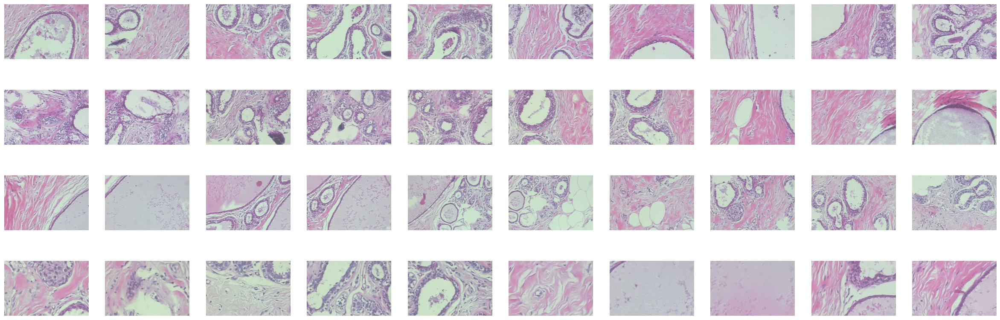

In [ ]:
import cv2
plt.figure(figsize = (30,10))
for i in range(0,40):
    try:
        path = "../Cancer/" + benign_df['file_loc'].iloc[i]
        img = cv2.imread(path, 1)
        if img is not None:
            plt.subplot(4, 10, i + 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.axis('off')
    except (KeyError, IndexError):
        # Handle KeyError or IndexError gracefully
        plt.subplot(4, 10, i + 1)
        plt.text(0.5, 0.5, 'Image not found', ha='center', va='center')
        plt.axis('off')
plt.show()

Visualizing Malignant(Cancerous) images

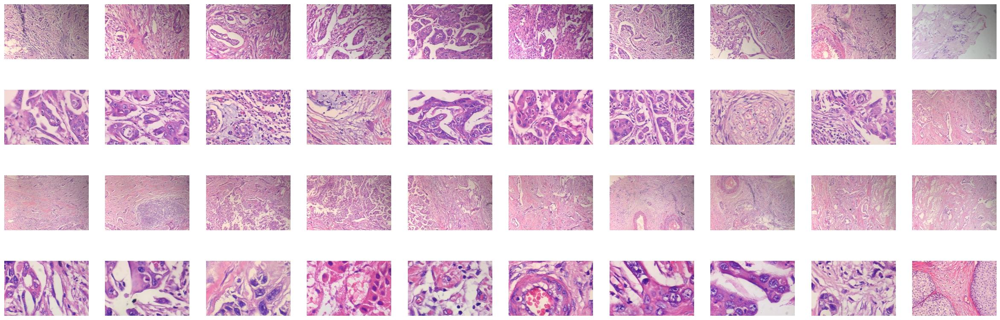

In [ ]:
images = malignant_df['file_loc'].values
plt.figure(figsize = (30,10))

for i in range(0,40):
    try:
        plt.subplot(4,10,i+1)
        img = cv2.imread("../Cancer/"+ images[i],1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    except (KeyError, IndexError):
        # Handle KeyError or IndexError gracefully
        plt.subplot(4, 10, i + 1)
        plt.text(0.5, 0.5, 'Image not found', ha='center', va='center')
        plt.axis('off')
plt.show()


In [ ]:
benign_samples = df1[df1['label'] == 'benign']
malignant_samples = df1[df1['label'] == 'malignant']
print('Number of samples Before data augmentation')
print("benign:", benign_samples.shape)
print("malignant:", malignant_samples.shape)

Number of samples Before data augmentation
benign: (2480, 3)
malignant: (5429, 3)


Upsampling the minority number of samples class to the majority class

In [ ]:
from sklearn.utils import resample

benign_samples = df1[df1['label'] == 'benign']
malignant_samples = df1[df1['label'] == 'malignant']

# Upsampling
benign_samples_upsampled = resample(benign_samples,
                                       replace=True,
                                       n_samples=len(malignant_samples),
                                       random_state=42)

oversampled_data = pd.concat([malignant_samples, benign_samples_upsampled])


In [ ]:
benign_samples = oversampled_data[oversampled_data['label'] == 'benign']
malignant_samples = oversampled_data[oversampled_data['label'] == 'malignant']
print('Number of samples after data augmentation')
print("benign:", benign_samples.shape)
print("malignant:", malignant_samples.shape)

Number of samples after data augmentation
benign: (5429, 3)
malignant: (5429, 3)


Splitting the data into Train, Validation and Test samples

In [ ]:
train_and_val_data, test_data = train_test_split(df1, test_size = 0.2, random_state = 53)
train_data, val_data = train_test_split(train_and_val_data, test_size = 0.2, random_state = 56)

In [ ]:
print("Training size :", train_data.shape)
print("Validation size :", val_data.shape)
print("Testing size :", test_data.shape)

Training size : (5061, 3)
Validation size : (1266, 3)
Testing size : (1582, 3)


Number of samples in each class in Train, validation and test data

In [ ]:
tr_malignant=train_data[train_data['class']==1]
tr_beingn=train_data[train_data['class']==0]
val_malignant=val_data[val_data['class']==1]
val_beingn=val_data[val_data['class']==0]
test_malignant=test_data[test_data['class']==1]
test_beingn=test_data[test_data['class']==0]

print('Training data')
print('malignant',tr_malignant.count())
print('beingn',tr_beingn.count())
print('validation data')
print('malignant',val_malignant.count())
print('beingn',val_beingn.count())
print('Testing data')
print('malignant',test_malignant.count())
print('beingn',test_beingn.count())

Training data
malignant label    3499
class    3499
mag      3499
dtype: int64
beingn label    1562
class    1562
mag      1562
dtype: int64
validation data
malignant label    860
class    860
mag      860
dtype: int64
beingn label    406
class    406
mag      406
dtype: int64
Testing data
malignant label    1070
class    1070
mag      1070
dtype: int64
beingn label    512
class    512
mag      512
dtype: int64


In [ ]:

benign_trainsamples = train_data[train_data['label'] == 'benign']
malignant_trainsamples = train_data[train_data['label'] == 'malignant']

#upsampling
malignant_trainsamples_upsampled = resample(malignant_trainsamples,
                                       replace=True,
                                       n_samples=len(benign_trainsamples),
                                       random_state=42)

sampled_train_data = pd.concat([benign_trainsamples, malignant_trainsamples_upsampled])


In [ ]:

benign_valsamples = val_data[val_data['label'] == 'benign']
malignant_valsamples = val_data[val_data['label'] == 'malignant']

# Upsampling
benign_valsamples_upsampled = resample(benign_valsamples,
                                       replace=True,
                                       n_samples=len(malignant_valsamples),
                                       random_state=42)

sampled_val_data = pd.concat([malignant_valsamples, benign_valsamples_upsampled])

In [ ]:

benign_testsamples = test_data[test_data['label'] == 'benign']
malignant_testsamples = test_data[test_data['label'] == 'malignant']

# Upsampling
benign_testsamples_upsampled = resample(benign_testsamples,
                                       replace=True,
                                       n_samples=len(malignant_testsamples),
                                       random_state=42)

sampled_test_data = pd.concat([malignant_testsamples, benign_testsamples_upsampled])

In [ ]:
sampled_test_data

,label,class,mag
file_loc,,,
malignant_SOB_M_DC-14-16336-200-004.png,malignant,1,200
malignant_SOB_M_PC-15-190EF-100-011.png,malignant,1,100
malignant_SOB_M_DC-14-9461-200-031.png,malignant,1,200
malignant_SOB_M_PC-14-9146-400-012.png,malignant,1,400
malignant_SOB_M_MC-14-13418DE-40-005.png,malignant,1,40
...,...,...,...
benign_SOB_B_A-14-22549AB-200-028.png,benign,0,200
benign_SOB_B_TA-14-16184CD-40-002.png,benign,0,40
benign_SOB_B_F-14-23060CD-200-013.png,benign,0,200


Sub-sampling the test data based on the magnificant levels of the images

In [ ]:
test_40 = sampled_test_data[sampled_test_data['mag']=='40']
test_100 = sampled_test_data[sampled_test_data['mag']=='100']
test_200 = sampled_test_data[sampled_test_data['mag']=='200']
test_400 = sampled_test_data[sampled_test_data['mag']=='400']

Checking the number of samples in each class in each magnificiant level

In [ ]:
t_40_mal=test_40[test_40['class']==1]
t_40_ben=test_40[test_40['class']==0]
t_100_mal=test_40[test_40['class']==1]
t_100_ben=test_40[test_40['class']==0]
t_200_mal=test_40[test_40['class']==1]
t_200_ben=test_40[test_40['class']==0]
t_400_mal=test_40[test_40['class']==1]
t_400_ben=test_40[test_40['class']==0]
print('40X')
print(t_40_mal.count(),t_40_ben.count())
print('100X')
print(t_100_mal.count(),t_100_ben.count())
print('200X')
print(t_200_mal.count(),t_200_ben.count())
print('400X')
print(t_400_mal.count(),t_400_ben.count())

40X
label    277
class    277
mag      277
dtype: int64 label    244
class    244
mag      244
dtype: int64
100X
label    277
class    277
mag      277
dtype: int64 label    244
class    244
mag      244
dtype: int64
200X
label    277
class    277
mag      277
dtype: int64 label    244
class    244
mag      244
dtype: int64
400X
label    277
class    277
mag      277
dtype: int64 label    244
class    244
mag      244
dtype: int64


Data augmentation for the sub-samples of the test data

In [ ]:
tr_malignant=sampled_train_data[sampled_train_data['class']==1]
tr_beingn=sampled_train_data[sampled_train_data['class']==0]
val_malignant=sampled_val_data[sampled_val_data['class']==1]
val_beingn=sampled_val_data[sampled_val_data['class']==0]
test_malignant=sampled_test_data[sampled_test_data['class']==1]
test_beingn=sampled_test_data[sampled_test_data['class']==0]
print('after augmentation')
print('Training data')
print('malignant',tr_malignant.count())
print('beingn',tr_beingn.count())
print('validation data')
print('malignant',val_malignant.count())
print('beingn',val_beingn.count())
print('Testing data')
print('malignant',test_malignant.count())
print('beingn',test_beingn.count())

after augmentation
Training data
malignant label    1562
class    1562
mag      1562
dtype: int64
beingn label    1562
class    1562
mag      1562
dtype: int64
validation data
malignant label    860
class    860
mag      860
dtype: int64
beingn label    860
class    860
mag      860
dtype: int64
Testing data
malignant label    1070
class    1070
mag      1070
dtype: int64
beingn label    1070
class    1070
mag      1070
dtype: int64


Directories to store the sub-samples of test data

In [ ]:
os.makedirs("../test_40")
os.makedirs("../test_100")
os.makedirs("../test_200")
os.makedirs("../test_400")
os.makedirs("../test_40/benign")
os.makedirs("../test_40/malignant")
os.makedirs("../test_100/benign")
os.makedirs("../test_100/malignant")
os.makedirs("../test_200/benign")
os.makedirs("../test_200/malignant")
os.makedirs("../test_400/benign")
os.makedirs("../test_400/malignant")


Directories to store the train, test and validation images

In [ ]:
import cv2
os.makedirs("../train_data")
os.makedirs("../test_data")
os.makedirs("../validation_data")
os.makedirs("../train_data/benign")
os.makedirs("../train_data/malignant")
os.makedirs("../validation_data/benign")
os.makedirs("../validation_data/malignant")
os.makedirs("../test_data/benign")
os.makedirs("../test_data/malignant")


function to store the images to the desired directory

In [ ]:
def storedata(df, source_dir, dest_dir):
    """Process images and organize data based on labels."""
    i = 1
    for image in df.index:
        if image != ".DS_Store":
            target = df1.loc[image, 'class']
            if target == 1:
                label = 'malignant'
            else:
                label = 'benign'
            src = os.path.join(source_dir, image)
            dest = os.path.join(dest_dir, label, f"image{i}.png")
            img = np.array(cv2.imread(src))
            cv2.imwrite(dest, img)
            i = i + 1

Storing train, validation and test data to their directories

In [ ]:
storedata(sampled_train_data, "../Cancer/", "../train_data/")
storedata(sampled_val_data, "../Cancer/", "../validation_data/")
storedata(sampled_test_data, "../Cancer/", "../test_data/")


Storing sub-samples of the test data to their directories

In [ ]:
storedata(test_40, "../Cancer/", "../test_40/")
storedata(test_100, "../Cancer/", "../test_100/")
storedata(test_200, "../Cancer/", "../test_200/")
storedata(test_400, "../Cancer/", "../test_400/")

Checking if the images are of equal size in both class

Checking if the images are of equal size in both class

In [ ]:
print("40X:")
print("Benign size:",len(os.listdir("../test_40/benign/")))
print("Malignant size :",len(os.listdir("../test_40/malignant/")))
print(" ")
print("100X:")
print("Benign size:",len(os.listdir("../test_100/benign/")))
print("Malignant size :",len(os.listdir("../test_100/malignant/")))
print(" ")
print("200X:")
print("Benign size:",len(os.listdir("../test_200/benign/")))
print("Malignant size :",len(os.listdir("../test_200/malignant/")))
print(" ")
print("400X:")
print("Benign size:",len(os.listdir("../test_400/benign/")))
print("Malignant size :",len(os.listdir("../test_400/malignant/")))

40X:
Benign size: 244
Malignant size : 277
 
100X:
Benign size: 334
Malignant size : 282
 
200X:
Benign size: 234
Malignant size : 274
 
400X:
Benign size: 258
Malignant size : 237


Implementing data augmentation to train, validation, test and sub-samples of test data

In [ ]:
img_size = 224
dim = (img_size, img_size)


zoom = [.99, 1.01]
b_range = [0.8, 1.2]
flip = True
f_mode = "constant"
d_format = "channels_last"

generator = ImageDataGenerator(rescale = 1./255,
                                     brightness_range=b_range,
                                     zoom_range=zoom,
                                     data_format=d_format,
                                     fill_mode=f_mode,
                                     horizontal_flip=flip)

In [ ]:
train_data_gen = generator.flow_from_directory("../train_data/", target_size=dim, batch_size=6500, shuffle=False)
val_data_gen = generator.flow_from_directory("../validation_data/", target_size=dim, batch_size=6500, shuffle=False)
test_data_gen = generator.flow_from_directory("../test_data/", target_size=dim, batch_size=6500, shuffle=False)

Found 3124 images belonging to 2 classes.
Found 1720 images belonging to 2 classes.
Found 2140 images belonging to 2 classes.


In [ ]:
test_40_gen = generator.flow_from_directory("../test_40/", target_size=dim, batch_size=6500, shuffle=False)
test_100_gen = generator.flow_from_directory("../test_100/", target_size=dim, batch_size=6500, shuffle=False)
test_200_gen = generator.flow_from_directory("../test_200/", target_size=dim, batch_size=6500, shuffle=False)
test_400_gen = generator.flow_from_directory("../test_400/", target_size=dim, batch_size=6500, shuffle=False)


Found 521 images belonging to 2 classes.
Found 616 images belonging to 2 classes.
Found 508 images belonging to 2 classes.
Found 495 images belonging to 2 classes.


In [ ]:
train_data_aug, train_labels_aug = train_data_gen.next()
val_data_aug, val_labels_aug=val_data_gen.next()
test_data_aug, test_labels_aug=test_data_gen.next()

In [ ]:
test_40_data, test_40_labels = test_40_gen.next()
test_100_data, test_100_labels = test_100_gen.next()
test_200_data, test_200_labels = test_200_gen.next()
test_400_data, test_400_labels = test_400_gen.next()

Checking if the samples in each class are equal after augmentation

In [ ]:
trainunique_labels, trainlabel_counts = np.unique(train_labels_aug, return_counts=True)

for label, count in zip(trainunique_labels, trainlabel_counts):
    print(f"trainLabel {label}: {count} samples")

valunique_labels, vallabel_counts = np.unique(val_labels_aug, return_counts=True)

for label, count in zip(valunique_labels, vallabel_counts):
    print(f"ValLabel {label}: {count} samples")

testunique_labels, testlabel_counts = np.unique(test_labels_aug, return_counts=True)

for label, count in zip(testunique_labels, testlabel_counts):
    print(f"testLabel {label}: {count} samples")

trainLabel 0.0: 3124 samples
trainLabel 1.0: 3124 samples
ValLabel 0.0: 1720 samples
ValLabel 1.0: 1720 samples
testLabel 0.0: 2140 samples
testLabel 1.0: 2140 samples


In [ ]:
testunique_labels, testlabel_counts = np.unique(test_40_labels, return_counts=True)

for label, count in zip(testunique_labels, testlabel_counts):
    print(f"testLabel {label}: {count} samples")

testunique_labels, testlabel_counts = np.unique(test_100_labels, return_counts=True)

for label, count in zip(testunique_labels, testlabel_counts):
    print(f"testLabel {label}: {count} samples")

testunique_labels, testlabel_counts = np.unique(test_200_labels, return_counts=True)

for label, count in zip(testunique_labels, testlabel_counts):
    print(f"testLabel {label}: {count} samples")

testunique_labels, testlabel_counts = np.unique(test_400_labels, return_counts=True)

for label, count in zip(testunique_labels, testlabel_counts):
    print(f"testLabel {label}: {count} samples")

testLabel 0.0: 521 samples
testLabel 1.0: 521 samples
testLabel 0.0: 616 samples
testLabel 1.0: 616 samples
testLabel 0.0: 508 samples
testLabel 1.0: 508 samples
testLabel 0.0: 495 samples
testLabel 1.0: 495 samples


Function to plot the learning curve

In [ ]:
def plot_learning_curve(history):
    """
    Plot the learning curve for loss and accuracy.

    Parameters:
    - history: The history object obtained from model training.

    Returns:
    - None (displays the plot)
    """
    # Get training loss and accuracy values
    train_loss = history.history['loss']
    train_acc = history.history['accuracy']

    # Get validation loss and accuracy values
    val_loss = history.history['val_loss']
    val_acc = history.history['val_accuracy']

    plt.figure(figsize=(6, 5))

    # Plot the loss curve
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')

    # Plot the accuracy curve
    plt.plot(train_acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')

    plt.xlabel('Epochs')
    plt.ylabel('Loss / Accuracy')
    plt.title('Learning Curve')
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

INCEPTIONV3 MODEL

In [ ]:
from keras.optimizers import Adam
inception_model = InceptionV3(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
# Add your own top layer for classification
x = inception_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)
x = Dropout(0.5)(x)
x = Dropout(0.3)(x)
# Create the final model
model = Model(inputs=inception_model.input, outputs=predictions)
# Freeze the pre-trained layers
for layer in inception_model.layers:
    layer.trainable = False
learning_rate=0.0001
optimizer=Adam(learning_rate)
# Compile the model
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

87910968/87910968 [==============================] - 4s 0us/step


In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5)
# Train the model
inception_model = model.fit(train_data_aug, train_labels_aug,epochs=10,
    batch_size=32,validation_data=(val_data_aug, val_labels_aug),callbacks=[early_stopping])

Epoch 1/10
98/98 [==============================] - 22s 170ms/step - loss: 0.5479 - accuracy: 0.7187 - val_loss: 0.5108 - val_accuracy: 0.7593
Epoch 2/10
98/98 [==============================] - 12s 126ms/step - loss: 0.4461 - accuracy: 0.7976 - val_loss: 0.5048 - val_accuracy: 0.7500
Epoch 3/10
98/98 [==============================] - 12s 126ms/step - loss: 0.3987 - accuracy: 0.8258 - val_loss: 0.4778 - val_accuracy: 0.7749
Epoch 4/10
98/98 [==============================] - 12s 124ms/step - loss: 0.3548 - accuracy: 0.8491 - val_loss: 0.4931 - val_accuracy: 0.7697
Epoch 5/10
98/98 [==============================] - 12s 121ms/step - loss: 0.3289 - accuracy: 0.8702 - val_loss: 0.4868 - val_accuracy: 0.7691
Epoch 6/10
98/98 [==============================] - 12s 123ms/step - loss: 0.2968 - accuracy: 0.8836 - val_loss: 0.4677 - val_accuracy: 0.7871
Epoch 7/10
98/98 [==============================] - 12s 123ms/step - loss: 0.2742 - accuracy: 0.9019 - val_loss: 0.4613 - val_accuracy: 0.7894

Storing the trained weights of the inception model as a pickle file for easy access

In [ ]:
import pickle

# Specify the file path to save the weights as a pickle file
weights_file_path = '/content/drive/MyDrive/Cancerdetection/pickle_files/inception_model.pkl'

# Save the weights as a pickle file
with open(weights_file_path, 'wb') as file:
    pickle.dump(inception_model, file)

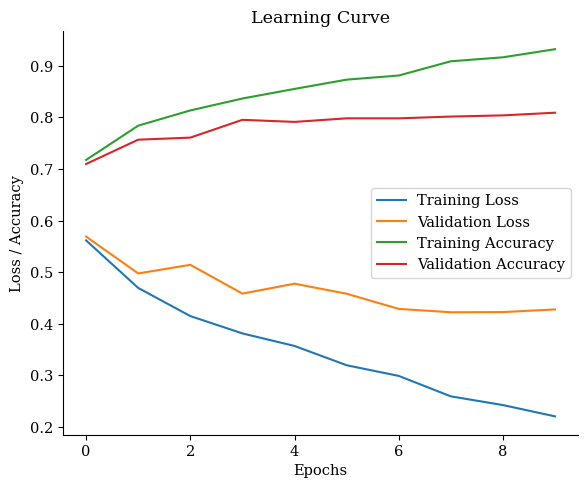

In [ ]:
plot_learning_curve(inception_model)


In [ ]:
##ROBUSTNESS CHECK

test_loss, test_acc = model.evaluate(test_data_aug, test_labels_aug)
print('test acc:',test_acc)
print('test loss:',test_loss)
test40_loss, test40_acc = model.evaluate(test_40_data, test_40_labels)
print('40Xtest acc:',test40_acc)
print('40Xtest loss:',test40_loss)
test100_loss, test100_acc = model.evaluate(test_100_data, test_100_labels)
print('100Xtest acc:',test100_acc)
print('100Xtest loss:',test100_loss)
test200_loss, test200_acc = model.evaluate(test_200_data, test_200_labels)
print('200Xtest acc:',test200_acc)
print('200Xtest loss:',test200_loss)
test400_loss, test400_acc = model.evaluate(test_400_data, test_400_labels)
print('400Xtest acc:',test400_acc)
print('400Xtest loss:',test400_loss)

66/66 [==============================] - 6s 72ms/step - loss: 0.4047 - accuracy: 0.8139
test acc: 0.8139204382896423
test loss: 0.4046574831008911
17/17 [==============================] - 2s 80ms/step - loss: 0.4140 - accuracy: 0.8046
40Xtest acc: 0.8046421408653259
40Xtest loss: 0.4139770269393921
17/17 [==============================] - 2s 83ms/step - loss: 0.4013 - accuracy: 0.8044
100Xtest acc: 0.8044280409812927
100Xtest loss: 0.40127551555633545
17/17 [==============================] - 2s 75ms/step - loss: 0.3691 - accuracy: 0.8590
200Xtest acc: 0.8590475916862488
200Xtest loss: 0.3690866529941559
17/17 [==============================] - 2s 80ms/step - loss: 0.4712 - accuracy: 0.7917
400Xtest acc: 0.7916666865348816
400Xtest loss: 0.47118937969207764


Classification report for inceptionv3 model

In [ ]:
from sklearn.metrics import classification_report

y_pred = np.argmax(model.predict(test_data_aug), axis=1)

y_true = np.argmax(test_labels_aug, axis=1)

report = classification_report(y_true, y_pred)

# Print the classification report
print('Inception model')
print(report)

NameError: ignored

ResNet50V2 MODEL

In [ ]:
from keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
# Load the pre-trained ResNet50 model
base_model = ResNet50V2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# Adding classification layers on top of ResNet50
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)
#dropout layers for regularization
x = Dropout(0.5)(x)
x = Dropout(0.3)(x)
# Create the final model
resnet_model = Model(inputs=base_model.input, outputs=predictions)
# Freeze the pre-trained layers of ResNet50
for layer in base_model.layers:
    layer.trainable = False
optimizer = Adam(learning_rate=0.001)
# Compile the model
resnet_model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
# Training the ResNet model
base_model=resnet_model.fit(train_data_aug, train_labels_aug, epochs=30, batch_size=16,
                            validation_data=( val_data_aug, val_labels_aug), callbacks=[early_stopping])


Epoch 1/30
196/196 [==============================] - 84s 405ms/step - loss: 0.4958 - accuracy: 0.7606 - val_loss: 0.4218 - val_accuracy: 0.8000
Epoch 2/30
196/196 [==============================] - 70s 356ms/step - loss: 0.3545 - accuracy: 0.8380 - val_loss: 0.3730 - val_accuracy: 0.8297
Epoch 3/30
196/196 [==============================] - 70s 358ms/step - loss: 0.2438 - accuracy: 0.9011 - val_loss: 0.3860 - val_accuracy: 0.8413
Epoch 4/30
196/196 [==============================] - 68s 349ms/step - loss: 0.1671 - accuracy: 0.9328 - val_loss: 0.5007 - val_accuracy: 0.8012
Epoch 5/30
196/196 [==============================] - 70s 360ms/step - loss: 0.1166 - accuracy: 0.9574 - val_loss: 0.4024 - val_accuracy: 0.8494
Epoch 6/30
196/196 [==============================] - 71s 360ms/step - loss: 0.0636 - accuracy: 0.9811 - val_loss: 0.4951 - val_accuracy: 0.8570
Epoch 7/30
196/196 [==============================] - 71s 361ms/step - loss: 0.0349 - accuracy: 0.9891 - val_loss: 0.6430 - val_ac

Storing the trained weights of the resnet model as a pickle file for easy access

In [ ]:
import pickle

# Specify the file path to save the weights as a pickle file
weights_file_path = '/content/drive/MyDrive/Cancerdetection/pickle_files/base_model.pkl'

# Save the weights as a pickle file
with open(weights_file_path, 'wb') as file:
    pickle.dump(base_model, file)

In [ ]:
##ROBUSTNESS CHECK

test_loss, test_acc = resnet_model.evaluate(test_data_aug, test_labels_aug)
print('test acc:',test_acc)
print('test loss:',test_loss)
test40_loss, test40_acc = resnet_model.evaluate(test_40_data, test_40_labels)
print('40Xtest acc:',test40_acc)
print('40Xtest loss:',test40_loss)
test100_loss, test100_acc = resnet_model.evaluate(test_100_data, test_100_labels)
print('100Xtest acc:',test100_acc)
print('100Xtest loss:',test100_loss)
test200_loss, test200_acc = resnet_model.evaluate(test_200_data, test_200_labels)
print('200Xtest acc:',test200_acc)
print('200Xtest loss:',test200_loss)
test400_loss, test400_acc = resnet_model.evaluate(test_400_data, test_400_labels)
print('400Xtest acc:',test400_acc)
print('400Xtest loss:',test400_loss)

67/67 [==============================] - 31s 439ms/step - loss: 0.3771 - accuracy: 0.8364
test acc: 0.836448609828949
test loss: 0.37706121802330017
17/17 [==============================] - 7s 399ms/step - loss: 0.4124 - accuracy: 0.8100
40Xtest acc: 0.8099808096885681
40Xtest loss: 0.4123535752296448
20/20 [==============================] - 10s 457ms/step - loss: 0.3577 - accuracy: 0.8442
100Xtest acc: 0.8441558480262756
100Xtest loss: 0.35766005516052246
16/16 [==============================] - 7s 429ms/step - loss: 0.3627 - accuracy: 0.8406
200Xtest acc: 0.8405511975288391
200Xtest loss: 0.3627226948738098
16/16 [==============================] - 8s 448ms/step - loss: 0.3532 - accuracy: 0.8343
400Xtest acc: 0.834343433380127
400Xtest loss: 0.35324302315711975


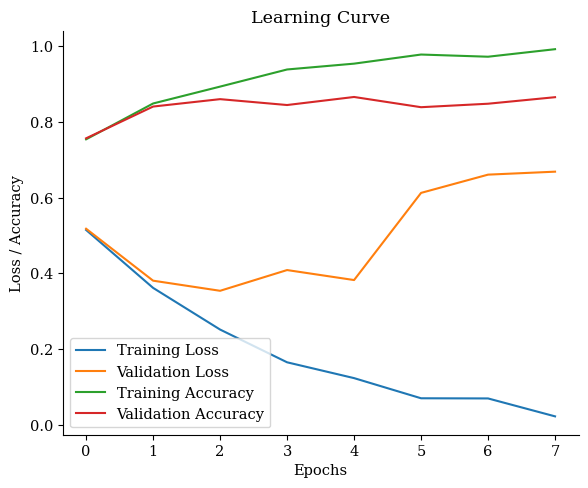

In [ ]:
plot_learning_curve(base_model)

Classification report of ResNet model

In [ ]:
from sklearn.metrics import classification_report

y_pred = np.argmax(resnet_model.predict(test_data_aug), axis=1)

y_true = np.argmax(test_labels_aug, axis=1)

report = classification_report(y_true, y_pred)

# Print the classification report
print('ResNet50V2 model')
print(report)

67/67 [==============================] - 11s 94ms/step
ResNet50V2 model
              precision    recall  f1-score   support

           0       0.84      0.87      0.86      1070
           1       0.87      0.83      0.85      1070

    accuracy                           0.85      2140
   macro avg       0.85      0.85      0.85      2140
weighted avg       0.85      0.85      0.85      2140



<Axes: >

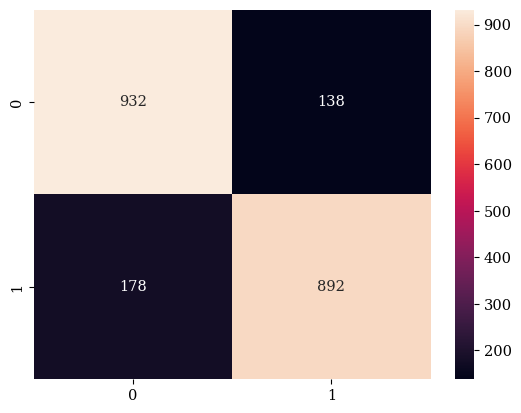

In [ ]:
cm = confusion_matrix(y_true, y_pred)
sb.heatmap(cm, annot=True, fmt="d")

In [ ]:
from PIL import Image

# Open the image
image = Image.open("input_image.jpg")

# Resize the image
resized_image = image.resize((128, 128))

# Save the resized image
resized_image.save("resized_image.jpg")

In [ ]:
img_size = 128
dim = (img_size, img_size)
tr_data_gen = generator.flow_from_directory("../train_data/", target_size=dim, batch_size=6500, shuffle=False)
v_data_gen = generator.flow_from_directory("../validation_data/", target_size=dim, batch_size=6500, shuffle=False)
t_data_gen = generator.flow_from_directory("../test_data/", target_size=dim, batch_size=6500, shuffle=False)

train_d_aug, train_l_aug = tr_data_gen.next()
val_d_aug, val_l_aug = v_data_gen.next()
test_d_aug, test_l_aug = t_data_gen.next()

Found 3128 images belonging to 2 classes.
Found 1724 images belonging to 2 classes.
Found 2140 images belonging to 2 classes.


In [ ]:
t_40_gen = generator.flow_from_directory("../test_40/", target_size=dim, batch_size=6500, shuffle=False)
t_100_gen = generator.flow_from_directory("../test_100/", target_size=dim, batch_size=6500, shuffle=False)
t_200_gen = generator.flow_from_directory("../test_200/", target_size=dim, batch_size=6500, shuffle=False)
t_400_gen = generator.flow_from_directory("../test_400/", target_size=dim, batch_size=6500, shuffle=False)
tes_40_data, tes_40_labels = t_40_gen.next()
tes_100_data, tes_100_labels = t_100_gen.next()
tes_200_data, tes_200_labels = t_200_gen.next()
tes_400_data, tes_400_labels = t_400_gen.next()

Found 593 images belonging to 2 classes.
Found 568 images belonging to 2 classes.
Found 510 images belonging to 2 classes.
Found 469 images belonging to 2 classes.


CNN Model

In [ ]:
#CNN MODEL
model = Sequential()
model.add(Conv2D(filters = 32, kernel_size = (3,3), input_shape = (128,128,3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))

model.add(Conv2D(filters = 64, kernel_size = (3,3), padding = 'same',activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))

model.add(Conv2D(filters = 128, kernel_size = (3,3), padding = 'same', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Dropout(0.4))

model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = 'same', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Dropout(0.2))
model.add(Flatten())

model.add(Dense(256, activation = 'relu'))
model.add(Dense(128, activation = 'relu'))
model.add(Dense(2, activation = 'sigmoid'))
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 63, 63, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 63, 63, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 31, 31, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 31, 31, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 15, 15, 128)     

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay( 0.001, decay_steps=20*50,decay_rate=1,
  staircase=False)
def get_optimizer():
  return tf.keras.optimizers.Adam(lr_schedule)

model.compile(loss='binary_crossentropy', optimizer = get_optimizer(), metrics = ['accuracy'])
early_stop = EarlyStopping(monitor='val_loss',patience=5)
checkpoint = ModelCheckpoint("./Best_model/",save_best_only=True,)

In [ ]:
#Model is fitted using train and validation generator for 200 epochs
history = model.fit(train_d_aug, train_l_aug, validation_data=[val_d_aug, val_l_aug], epochs=30,
              verbose = 1)

Epoch 1/30
98/98 [==============================] - 18s 55ms/step - loss: 0.6061 - accuracy: 0.6493 - val_loss: 0.5177 - val_accuracy: 0.7425
Epoch 2/30
98/98 [==============================] - 4s 42ms/step - loss: 0.4948 - accuracy: 0.7826 - val_loss: 0.4843 - val_accuracy: 0.7999
Epoch 3/30
98/98 [==============================] - 4s 43ms/step - loss: 0.5008 - accuracy: 0.7820 - val_loss: 0.4492 - val_accuracy: 0.8167
Epoch 4/30
98/98 [==============================] - 4s 43ms/step - loss: 0.4817 - accuracy: 0.7877 - val_loss: 0.4909 - val_accuracy: 0.8208
Epoch 5/30
98/98 [==============================] - 4s 42ms/step - loss: 0.4630 - accuracy: 0.8018 - val_loss: 0.4598 - val_accuracy: 0.8039
Epoch 6/30
98/98 [==============================] - 4s 42ms/step - loss: 0.4351 - accuracy: 0.8178 - val_loss: 0.4187 - val_accuracy: 0.8225
Epoch 7/30
98/98 [==============================] - 4s 42ms/step - loss: 0.4383 - accuracy: 0.8069 - val_loss: 0.3913 - val_accuracy: 0.8248
Epoch 8/30
9

In [ ]:
test_loss, test_acc = model.evaluate(test_d_aug, test_l_aug)
print('test acc:',test_acc)
print('test loss:',test_loss)
test40_loss, test40_acc = model.evaluate(tes_40_data, tes_40_labels)
print('40Xtest acc:',test40_acc)
print('40Xtest loss:',test40_loss)
test100_loss, test100_acc = model.evaluate(tes_100_data, tes_100_labels)
print('100Xtest acc:',test100_acc)
print('100Xtest loss:',test100_loss)
test200_loss, test200_acc = model.evaluate(tes_200_data, tes_200_labels)
print('200Xtest acc:',test200_acc)
print('200Xtest loss:',test200_loss)
test400_loss, test400_acc = model.evaluate(tes_400_data, tes_400_labels)
print('400Xtest acc:',test400_acc)
print('400Xtest loss:',test400_loss)

67/67 [==============================] - 1s 10ms/step - loss: 0.3754 - accuracy: 0.8430
test acc: 0.8429906368255615
test loss: 0.37540221214294434
19/19 [==============================] - 0s 11ms/step - loss: 0.4003 - accuracy: 0.8347
40Xtest acc: 0.8347386121749878
40Xtest loss: 0.4002683162689209
18/18 [==============================] - 0s 9ms/step - loss: 0.3439 - accuracy: 0.8398
100Xtest acc: 0.8397887349128723
100Xtest loss: 0.3438858687877655
16/16 [==============================] - 0s 11ms/step - loss: 0.3698 - accuracy: 0.8392
200Xtest acc: 0.8392156958580017
200Xtest loss: 0.3698342740535736
15/15 [==============================] - 0s 11ms/step - loss: 0.3887 - accuracy: 0.8614
400Xtest acc: 0.8614072203636169
400Xtest loss: 0.3887301981449127


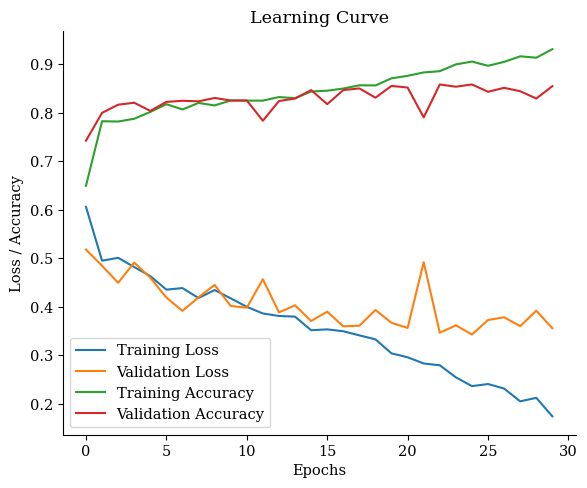

In [ ]:
plot_learning_curve(history)

In [ ]:
from sklearn.metrics import classification_report

y_pred = np.argmax(model.predict(test_d_aug), axis=1)

y_true = np.argmax(test_l_aug, axis=1)

report = classification_report(y_true, y_pred)

# Print the classification report
print('CNN model')
print(report)

67/67 [==============================] - 1s 8ms/step
CNN model
              precision    recall  f1-score   support

           0       0.87      0.81      0.84      1070
           1       0.82      0.88      0.85      1070

    accuracy                           0.84      2140
   macro avg       0.84      0.84      0.84      2140
weighted avg       0.84      0.84      0.84      2140



<Axes: >

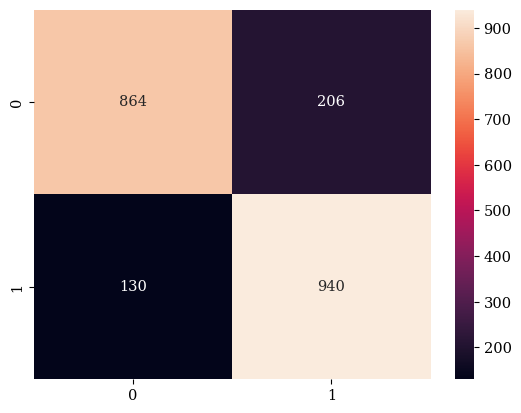

In [ ]:
cm = confusion_matrix(y_true, y_pred)
sb.heatmap(cm, annot=True, fmt="d")

LIME [Local interpretable model-agnostic explanations] IMPLEMENTATION

In [ ]:
import skimage.io
import skimage.segmentation
import sklearn.metrics
from sklearn.linear_model import LinearRegression
import copy

def perturb_image(img, perturbation, segments):
    active_pixels = np.where(perturbation == 1)[0]
    mask = np.zeros(segments.shape)
    for active in active_pixels:
        mask[segments == active] = 1
    perturbed_image = copy.deepcopy(img)
    perturbed_image = perturbed_image * mask[:, :, np.newaxis]
    return perturbed_image

def explain_image(resnet_model, image_path):
    img = skimage.io.imread(image_path)
    img = skimage.transform.resize(img, (224, 224))
    img = (img - 0.5) * 2

    preds = resnet_model.predict(img[np.newaxis, :, :, :])

    superpixels = skimage.segmentation.quickshift(img, kernel_size=4, max_dist=200, ratio=0.2)
    num_superpixels = np.unique(superpixels).shape[0]

    np.random.seed(222)
    num_perturb = 150
    perturbations = np.random.binomial(1, 0.5, size=(num_perturb, num_superpixels))

    predictions = []
    for pert in perturbations:
        perturbed_img = perturb_image(img, pert, superpixels)
        pred = resnet_model.predict(perturbed_img[np.newaxis, :, :, :])
        predictions.append(pred)

    predictions = np.array(predictions)

    original_image = np.ones(num_superpixels)[np.newaxis, :]

    distances = sklearn.metrics.pairwise_distances(perturbations, original_image, metric='cosine').ravel()

    kernel_width = 0.25
    weights = np.sqrt(np.exp(-(distances ** 2) / kernel_width ** 2))

    top_pred_classes = [0, 1]
    simpler_model = LinearRegression()
    simpler_model.fit(X=perturbations, y=predictions[:, :, top_pred_classes[0]], sample_weight=weights)
    coeff = simpler_model.coef_[0]

    num_top_features = 10
    top_features = np.argsort(coeff)[-num_top_features:]

    mask = np.zeros(num_superpixels)
    mask[top_features] = True

    extracted_feature = perturb_image(img / 2 + 0.5, mask, superpixels)

    return extracted_feature

In [ ]:
lime = explain_image(resnet_model,'/train_data/benign/image1288.png')


1/1 [==============================] - 0s 86ms/step


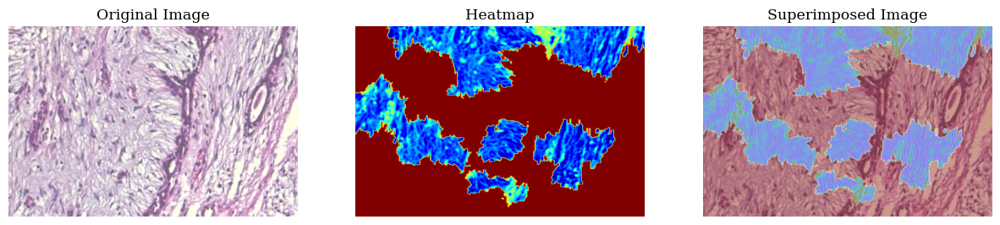

In [ ]:
visualize_gradcam('/train_data/benign/image1288.png',lime)

In [ ]:
import random
from PIL import Image

def select_random_images(folder_path, num_images):
    # Get a list of all image paths in the dataset
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    image_paths = [os.path.join(folder_path, image_file) for image_file in image_files]

    # Shuffle the image paths
    random.shuffle(image_paths)

    # Select a subset of random image paths
    random_image_paths = image_paths[:num_images]

    return random_image_paths

In [ ]:
H = 224
W = 224
def load_image(path, preprocess=True):
    """Load and preprocess image."""
    x = image.load_img(path, target_size=(H, W))
    if preprocess:
        x = image.img_to_array(x)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)
    return x

def normalize(x):
    min_val = tf.reduce_min(x)
    max_val = tf.reduce_max(x)
    x = (x - min_val) / (max_val - min_val + tf.keras.backend.epsilon())
    return x


In [ ]:
def grad_cam(input_model, image, cls, layer_name):
    """GradCAM method for visualizing input saliency."""
    with tf.device('/CPU:0'):
      with tf.GradientTape() as tape:
          # Watch the input image variable
          tape.watch(image)

          # Forward pass through the model
          conv_output = input_model(image, training=False)

          # Compute the score for the target class
          y_c = conv_output[0, cls]

      # Compute the gradients of the target class score with respect to the conv_output
      grads = tape.gradient(y_c, conv_output)
      grads = normalize(grads)
      if len(grads.shape) == 4:
        weights = tf.reduce_mean(grads, axis=(0, 1, 2))
      else:
        weights = tf.reduce_mean(grads, axis=0)

      # Multiply the weights with the conv_output
      cam = tf.reduce_sum(tf.multiply(weights, conv_output), axis=-1)

      # Normalize the CAM
      cam = np.maximum(cam, 0)
      cam /= np.max(cam) or 1


      # Resize the CAM to match the input image size
      cam = cv2.resize(cam, (image.shape[2], image.shape[1]), interpolation=cv2.INTER_LINEAR)

      return cam

In [ ]:
def visualize_heatmap(image_path, lime):
    # Load the original image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize the GradCAM heatmap to match the image size
    heatmap = cv2.resize(lime, (img.shape[1], img.shape[0]))

    # Normalize the heatmap to the range [0, 255]
    heatmap = np.uint8(255 * heatmap)

    # Apply a colormap to the heatmap
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Overlay the heatmap on the original image using alpha blending
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap_color, 0.4, 0)

    # Visualize the original image, heatmap, and superimposed image
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(img)
    ax[0].set_title('Original Image')
    ax[0].axis('off')
    ax[1].imshow(heatmap_color)
    ax[1].set_title('Heatmap')
    ax[1].axis('off')
    ax[2].imshow(superimposed_img)
    ax[2].set_title('Superimposed Image')
    ax[2].axis('off')
    plt.show()

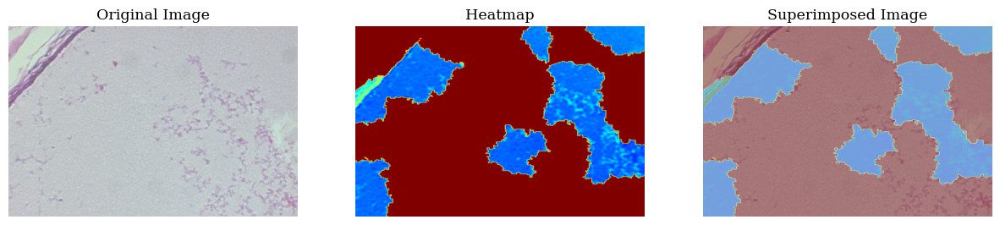

/train_data/benign/image1182.png
1/1 [==============================] - 0s 82ms/step


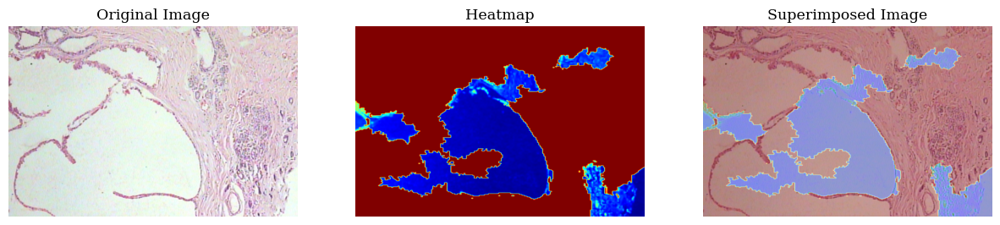

/train_data/benign/image1282.png
1/1 [==============================] - 0s 86ms/step


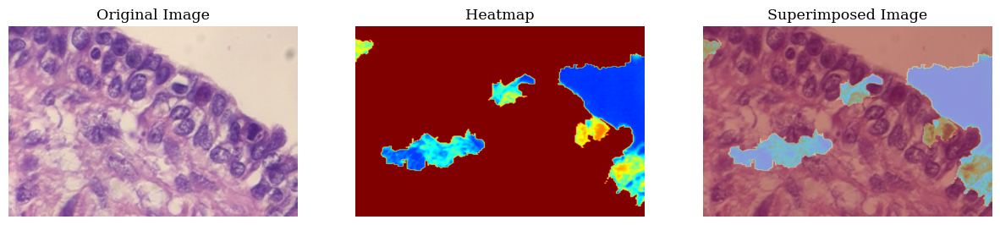

/train_data/benign/image272.png
1/1 [==============================] - 0s 78ms/step


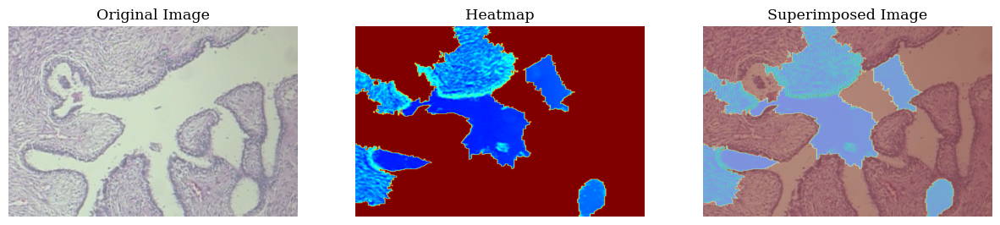

/train_data/benign/image56.png
1/1 [==============================] - 0s 90ms/step


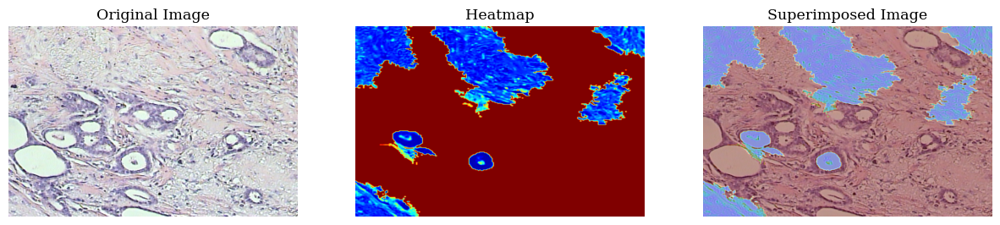

In [ ]:
num_images = 5
benign_path = '/train_data/benign'
malignant_path = '/train_data/malignant'
random_benign_paths = select_random_images(benign_path, num_images)
random_malignant_paths = select_random_images(malignant_path, num_images)
# Iterate over the selected random image paths
for image_path in random_benign_paths:
    # Load and preprocess the image
    print(image_path)
    lime = explain_image(resnet_model,image_path)
    # Visualize heatmap
    visualize_heatmap(image_path, lime)

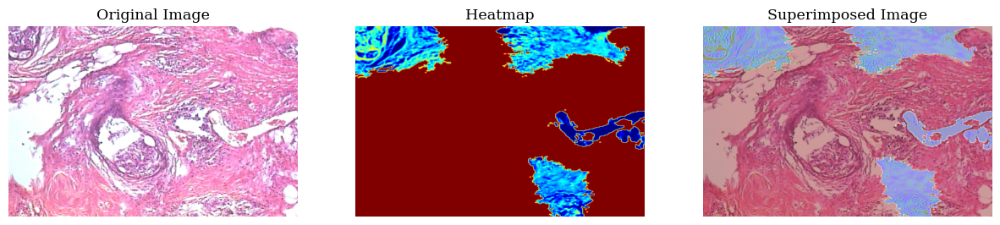

/train_data/malignant/image2104.png
1/1 [==============================] - 0s 100ms/step


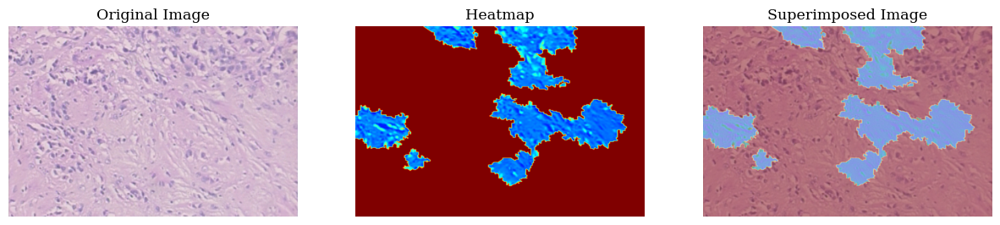

/train_data/malignant/image2228.png
1/1 [==============================] - 0s 101ms/step


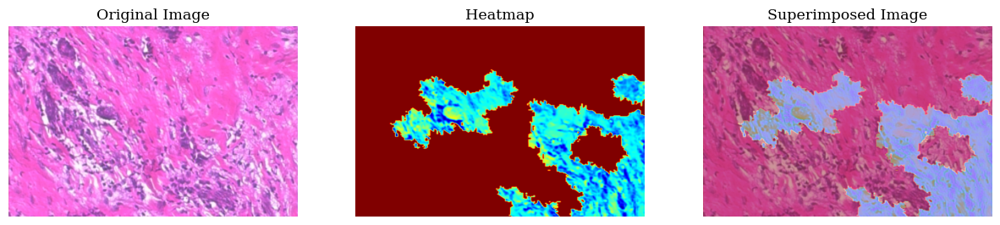

/train_data/malignant/image2040.png
1/1 [==============================] - 0s 97ms/step


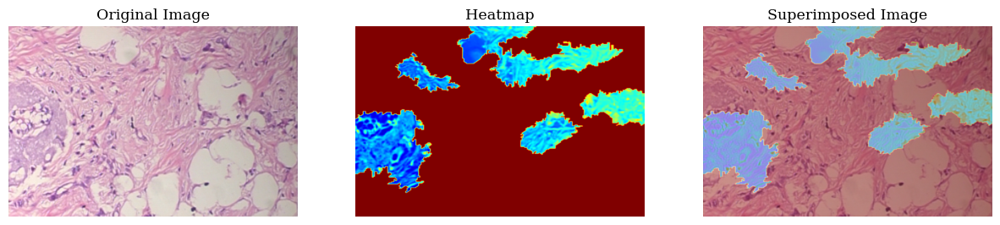

/train_data/malignant/image2675.png
1/1 [==============================] - 0s 92ms/step


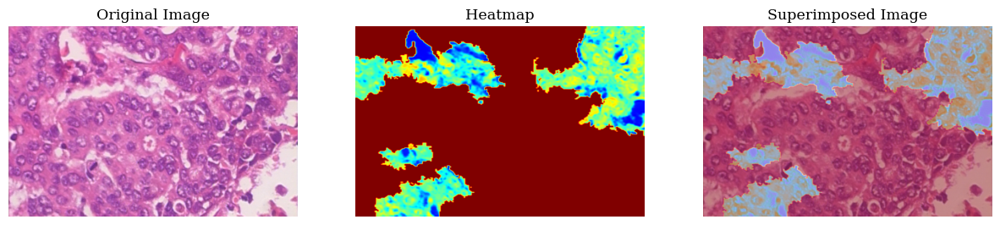

In [ ]:
for image_path in random_malignant_paths:
    print(image_path)
    # Compute GradCAM
    lime = explain_image(resnet_model,image_path)
    # Visualize GradCAM heatmap
    visualize_heatmap(image_path, lime)